In [1]:
# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


import xml.etree.cElementTree as ET
import glob
import os
import json
import random
import shutil

from PIL import Image, ImageOps

In [2]:
# Tagged data in XML format
with open('/content/annotations/maksssksksss0.xml') as f:
    contents = f.read()
    print(contents)


<annotation>
    <folder>images</folder>
    <filename>maksssksksss0.png</filename>
    <size>
        <width>512</width>
        <height>366</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>without_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>79</xmin>
            <ymin>105</ymin>
            <xmax>109</xmax>
            <ymax>142</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>185</xmin>
            <ymin>100</ymin>
            <xmax>226</xmax>
            <ymax>144</ymax>
        </bndbox>
    </object>
    <object>
        <name>without_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</

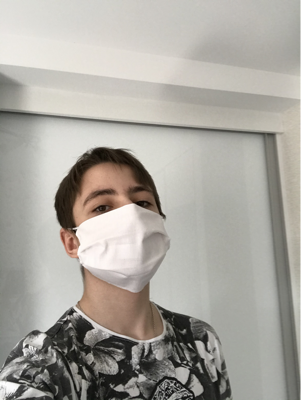

In [3]:
# A visual from inside the dataset
Image.open("/content/images/maksssksksss17.png")

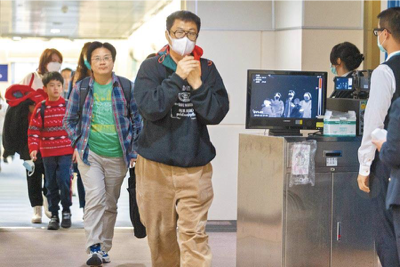

In [4]:
# A visual from inside the dataset
Image.open("/content/images/maksssksksss179.png")

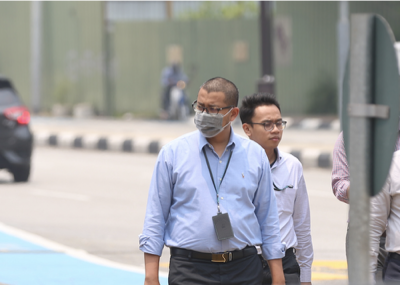

In [5]:
# A visual from inside the dataset
Image.open("/content/images/maksssksksss38.png")

# Prepare Data


prepared dataset for this YoloV8. It converts the data in XML format into TXT format tag. created the Traning tags for Yolo.



In [6]:
# Converting XML format data to TXT format
def xml_to_yolo_bbox(bbox, w, h):
    # xmin, ymin, xmax, ymax
    x_center = ((bbox[2] + bbox[0]) / 2) / w
    y_center = ((bbox[3] + bbox[1]) / 2) / h

    width = (bbox[2] - bbox[0]) / w
    height = (bbox[3] - bbox[1]) / h

    return [x_center, y_center, width, height]

def yolo_to_xml_bbox(bbox, w, h):
    # x_center, y_center, width, height
    w_half_len = (bbox[2] * w) / 2
    h_half_len = (bbox[3] * h) / 2

    xmin = int((bbox[0] * w) - w_half_len)
    ymin = int((bbox[1] * h) - h_half_len)
    xmax = int((bbox[0] * w) + w_half_len)
    ymax = int((bbox[1] * h) + h_half_len)

    return [xmin, ymin, xmax, ymax]

classes = ["without_mask", "with_mask", "mask_weared_incorrect"]

input_dir = "/content/annotations"
output_dir = "/content/labels"
image_dir = "/content/images"


if not os.path.isdir(output_dir):
    os.mkdir(output_dir)

import glob

files = glob.glob(os.path.join(input_dir, "*.xml"))
for fil in files:
    basename = os.path.basename(fil)
    filename = os.path.splitext(basename)[0]
    if not os.path.exists(os.path.join(image_dir, f"{filename}.png")):
        print(f"{filename} image does not exist!")
        continue

    result = []

    # Parse the content of the xml file
    tree = ET.parse(fil)
    root = tree.getroot()
    width = int(root.find("size").find("width").text)
    height = int(root.find("size").find("height").text)

    for obj in root.findall("object"):
        label = obj.find("name").text

        # check for new classes and append to list
        if label not in classes:
            classes.append(label)
        index = classes.index(label)
        pil_bbox = [int(x.text) for x in obj.find("bndbox")]
        yolo_bbox = xml_to_yolo_bbox(pil_bbox, width, height)

        # convert data to string
        bbox_string = " ".join([str(x) for x in yolo_bbox])
        result.append(f"{index} {bbox_string}")

    if result:
        # generate a yolo format text file for each xml file
        with open(os.path.join(output_dir, f"{filename}.txt"), "w", encoding = "utf-8") as f:
            f.write("\n".join(result))
# generate the classes file as reference
with open("/content/classes.txt", "w", encoding = "utf-8") as f:
    f.write(json.dumps(classes))

In [7]:
# Labels in the dataset
with open('/content/classes.txt') as f:
    contents = f.read()
    print(contents)

["without_mask", "with_mask", "mask_weared_incorrect"]


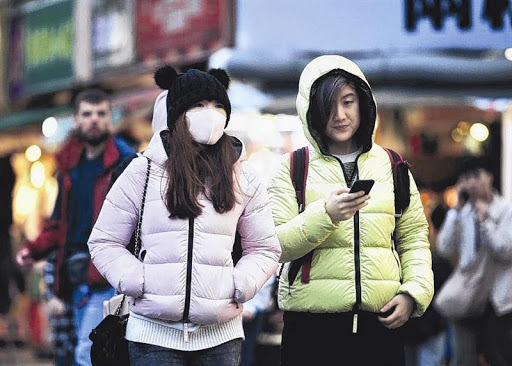

In [8]:
# An image in the DataSet
Image.open("/content/images/maksssksksss0.png")

In [9]:
# XML format tag of the image above
with open('/content/annotations/maksssksksss0.xml') as f:
    contents = f.read()
    print(contents)


<annotation>
    <folder>images</folder>
    <filename>maksssksksss0.png</filename>
    <size>
        <width>512</width>
        <height>366</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>without_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>79</xmin>
            <ymin>105</ymin>
            <xmax>109</xmax>
            <ymax>142</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>185</xmin>
            <ymin>100</ymin>
            <xmax>226</xmax>
            <ymax>144</ymax>
        </bndbox>
    </object>
    <object>
        <name>without_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</

In [10]:
# TXT version of the above label in XML format
with open('/content/labels/maksssksksss0.txt') as f:
    contents = f.read()
    print(contents)

0 0.18359375 0.337431693989071 0.05859375 0.10109289617486339
1 0.4013671875 0.3333333333333333 0.080078125 0.12021857923497267
0 0.6689453125 0.3155737704918033 0.068359375 0.13934426229508196


## Create Data For YoloV8
In this section, created the training dataset for YoloV8 using the label data and image data


In [11]:
# Names and creation of files prepared for YoloV8
if os.path.isfile("/content/data/"):
    print("Dosya mevcut! (There is folder!)")
else:
    os.mkdir("/content/data/")
    os.mkdir('/content/data/train')
    os.mkdir('/content/data/val')
    os.mkdir('/content/data/test')
    os.mkdir('/content/data/train/images')
    os.mkdir('/content/data/train/labels')
    os.mkdir('/content/data/test/images')
    os.mkdir('/content/data/test/labels')
    os.mkdir('/content/data/val/images')
    os.mkdir('/content/data/val/labels')

In [12]:
# Listing the names of image data together
metarial = []

for i in os.listdir("/content/images"):
    srt = i[:-4]
    metarial.append(srt)

In [13]:
# Initial data of Merarial list
metarial[0:10]

['maksssksksss711',
 'maksssksksss372',
 'maksssksksss592',
 'maksssksksss624',
 'maksssksksss814',
 'maksssksksss603',
 'maksssksksss11',
 'maksssksksss153',
 'maksssksksss445',
 'maksssksksss522']

In [14]:
# Data set creation function
def preparinbdata(main_txt_file, main_img_file, train_size, test_size, val_size):

    for i in range(0,train_size):

        source_txt = main_txt_file + "/" + metarial[i] + ".txt"
        source_img = main_img_file + "/" + metarial[i] + ".png"

        mstring = metarial[i]
        train_destination_txt = "/content/data/train/labels" + "/" + metarial[i] + ".txt"
        train_destination_png = "/content/data/train/images" + "/" + metarial[i] + ".png"

        shutil.copy(source_txt, train_destination_txt)
        shutil.copy(source_img, train_destination_png)




    for l in range(train_size , train_size + test_size):

        source_txt = main_txt_file + "/" + metarial[l] + ".txt"
        source_img = main_img_file + "/" + metarial[l] + ".png"

        mstring = metarial[l]
        test_destination_txt = "/content/data/test/labels" + "/" + metarial[l] + ".txt"
        test_destination_png = "/content/data/test/images" + "/" + metarial[l] + ".png"

        shutil.copy(source_txt, test_destination_txt)
        shutil.copy(source_img, test_destination_png)



    for n in range(train_size + test_size , train_size + test_size + val_size):

        source_txt = main_txt_file + "/" + metarial[n] + ".txt"
        source_img = main_img_file + "/" + metarial[n] + ".png"

        mstring = metarial[n]
        val_destination_txt = "/content/data/val/labels" + "/" + metarial[n] + ".txt"
        val_destination_png = "/content/data/val/images" + "/" + metarial[n] + ".png"

        shutil.copy(source_txt, val_destination_txt)
        shutil.copy(source_img, val_destination_png)



In [15]:

preparinbdata("/content/labels", "/content/images", 503, 150, 100)

In [16]:
# configure .yaml file to guide the model for training
%cd /content/data

yaml_text = """train: /content/data/train/images
val: /content/data/val/images

nc: 3
names: ["without_mask", "with_mask", "mask_weared_incorrect"]"""

with open("/content/data/data.yaml", 'w') as file:
    file.write(yaml_text)

%cat data/data.yaml

/content/data
cat: data/data.yaml: No such file or directory


# YoloV8


This file consists of downloading the YoloV8 library, training and detection parts.


In [17]:
# We install the 'ultralytics' library to use the YoloV8 library
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.188 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 27.0/78.2 GB disk)


## Training

I will perform the training using the data set I prepared in this section. I will do a 50-step training. If you want, you can increase this epochs


In [18]:
# /content/data
if os.path.isfile("/content/Result/"):
    print("Dosya mevcut! (There is folder!)")
else:
    os.mkdir("/content/Result/")

%cd /content/Result/

# YoloV8 model 50 step training
# data = "Path to the file with .yaml extension"
# epochs = How many steps will you train?
# imagsz = This is size of image at the training data
!yolo train model=yolov8n.pt data=/content/data/data.yaml epochs=50 imgsz=640

/content/Result
100% 6.23M/6.23M [00:00<00:00, 90.5MB/s]
Ultralytics YOLOv8.0.188 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data/data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fal

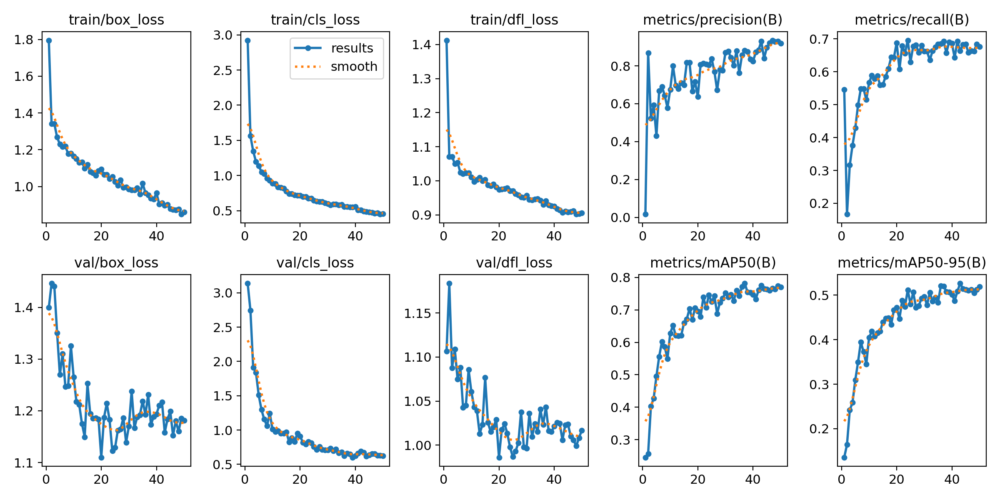

In [19]:
# The result of my training
Image.open("/content/Result/runs/detect/train/results.png")

## Detection

Tests are performed on the images in the test data set using the Best.pt file resulting from the training. At the same time, I will perform tests with real-life data.


In [20]:
# The detection process we performed on the test dataset
# model = 'best.pt' is the step with the best score of the model I trained.
# soruce = Image or image folder of detection operations
!yolo predict model=/content/Result/runs/detect/train/weights/best.pt source='/content/data/test/images'

Ultralytics YOLOv8.0.188 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients

image 1/150 /content/data/test/images/maksssksksss0.png: 480x640 2 without_masks, 1 with_mask, 168.8ms
image 2/150 /content/data/test/images/maksssksksss100.png: 384x640 1 without_mask, 3 with_masks, 77.1ms
image 3/150 /content/data/test/images/maksssksksss103.png: 480x640 4 with_masks, 6.6ms
image 4/150 /content/data/test/images/maksssksksss113.png: 448x640 1 without_mask, 3 with_masks, 51.1ms
image 5/150 /content/data/test/images/maksssksksss116.png: 384x640 5 with_masks, 6.4ms
image 6/150 /content/data/test/images/maksssksksss119.png: 480x640 2 without_masks, 5 with_masks, 6.6ms
image 7/150 /content/data/test/images/maksssksksss123.png: 512x640 3 with_masks, 51.7ms
image 8/150 /content/data/test/images/maksssksksss128.png: 640x512 1 without_mask, 53.4ms
image 9/150 /content/data/test/images/maksssksksss129.png: 480x640 2 without_

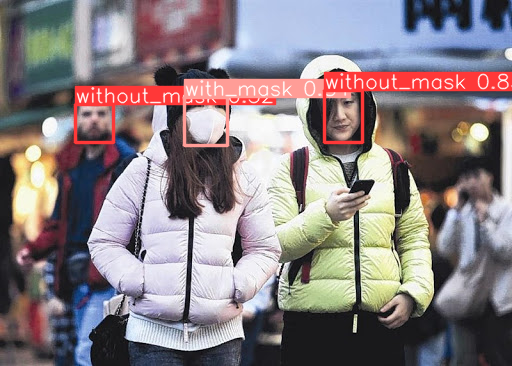

In [22]:
# Detection result:- 1
Image.open('/content/Result/runs/detect/predict/maksssksksss0.png')

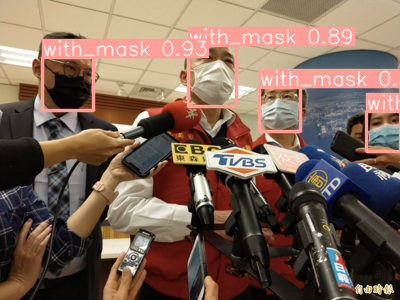

In [24]:
# Detection result:- 2
Image.open('/content/Result/runs/detect/predict/maksssksksss103.png')

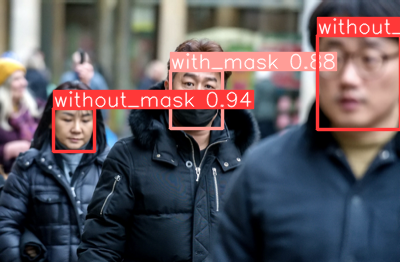

In [25]:
# Detection result:- 3
Image.open('/content/Result/runs/detect/predict/maksssksksss244.png')


Below is a detection process performed on real world data.

In [26]:
# Download the real-world data
%cd /content
!wget "https://onecms-res.cloudinary.com/image/upload/s--XV7DHKzY--/c_fill,g_auto,h_468,w_830/f_auto,q_auto/people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A"

# I check my upload and then change the name of the image I downloaded
if os.path.isfile("/content/people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A"):
  os.rename("people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A", "image.jpg")

/content
--2023-09-28 11:22:17--  https://onecms-res.cloudinary.com/image/upload/s--XV7DHKzY--/c_fill,g_auto,h_468,w_830/f_auto,q_auto/people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A
Resolving onecms-res.cloudinary.com (onecms-res.cloudinary.com)... 151.101.1.137, 151.101.65.137, 151.101.129.137, ...
Connecting to onecms-res.cloudinary.com (onecms-res.cloudinary.com)|151.101.1.137|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 44288 (43K) [image/jpeg]
Saving to: ‘people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A’

people-wearing-mask 100%[===================>]  43.25K   266KB/s    in 0.2s    

2023-09-28 11:22:18 (266 KB/s) - ‘people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A’ saved [44288/44288]



In [27]:
# Detection on real-world
%cd /content/Result
!yolo predict model=/content/Result/runs/detect/train/weights/best.pt source='/content/image.jpg'

/content/Result
Ultralytics YOLOv8.0.188 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients

image 1/1 /content/image.jpg: 384x640 5 without_masks, 2 with_masks, 89.1ms
Speed: 2.1ms preprocess, 89.1ms inference, 103.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


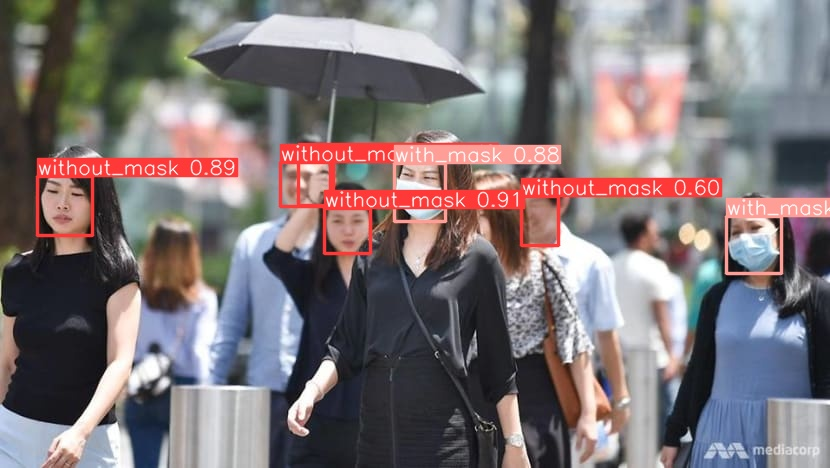

In [28]:
# Result of detection
Image.open('/content/Result/runs/detect/predict2/image.jpg')

In [29]:
# Download the real-world data
%cd /content
!wget "https://cloudfront-us-east-2.images.arcpublishing.com/reuters/KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg"

/content
--2023-09-28 11:22:49--  https://cloudfront-us-east-2.images.arcpublishing.com/reuters/KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg
Resolving cloudfront-us-east-2.images.arcpublishing.com (cloudfront-us-east-2.images.arcpublishing.com)... 99.84.203.29, 99.84.203.84, 99.84.203.55, ...
Connecting to cloudfront-us-east-2.images.arcpublishing.com (cloudfront-us-east-2.images.arcpublishing.com)|99.84.203.29|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2072180 (2.0M) [image/jpeg]
Saving to: ‘KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg’

KPYTVDNVAZIOFDEB2JJ 100%[===================>]   1.98M  5.32MB/s    in 0.4s    

2023-09-28 11:22:50 (5.32 MB/s) - ‘KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg’ saved [2072180/2072180]



In [30]:
# I check my upload and then change the name of the image I downloaded
if os.path.isfile("/content/KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg"):
  os.rename("KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg", "image2.jpg")

In [31]:
# Detection on real-world
%cd /content/Result
!yolo predict model=/content/Result/runs/detect/train/weights/best.pt source='/content/image2.jpg'

/content/Result
Ultralytics YOLOv8.0.188 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients

image 1/1 /content/image2.jpg: 480x640 3 without_masks, 1 with_mask, 54.8ms
Speed: 3.5ms preprocess, 54.8ms inference, 86.5ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


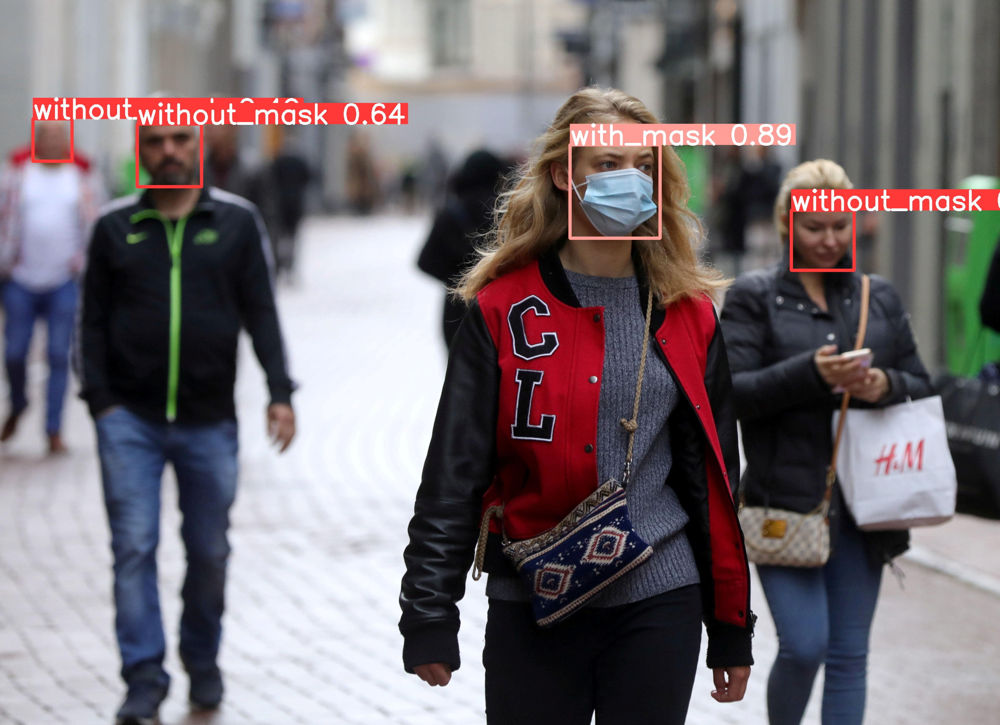

In [32]:
# Result of detection
Image.open('/content/Result/runs/detect/predict3/image2.jpg')